## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images

In [1]:
# Save image to output
def save_image(fname,prefix,img):
    fname = fname.split('/')[-1]
    fname = prefix + fname
    save_name = 'output_images/'+fname
    
    if len(img.shape) == 3:
        img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
        cv2.imwrite(save_name,img)
    else:        
        cv2.imwrite(save_name, img * 255) 
    

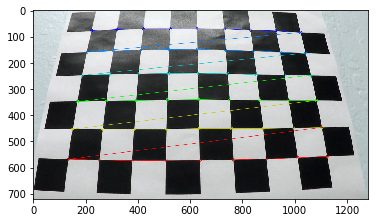

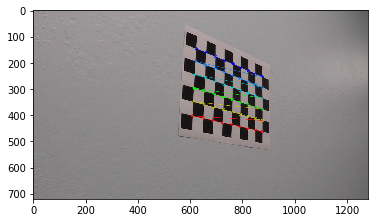

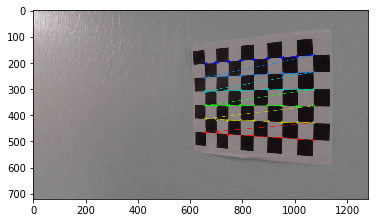

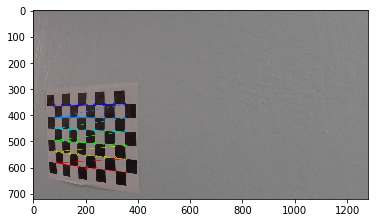

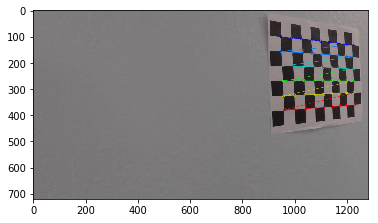

...

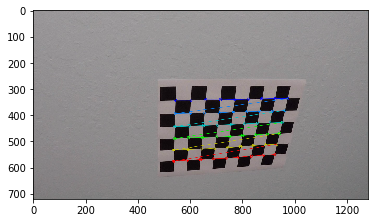

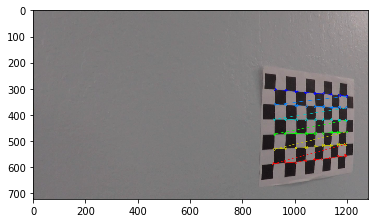

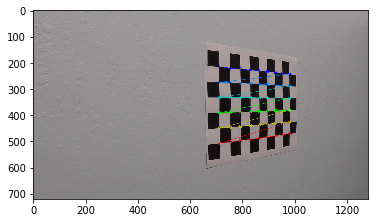

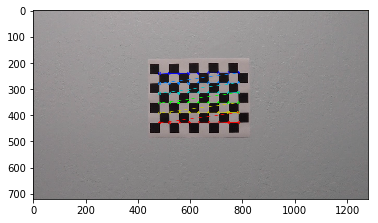

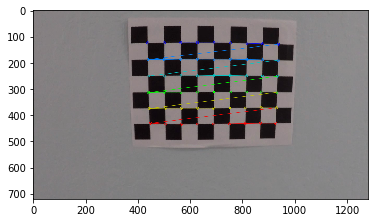

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.figure()
        plt.imshow(img)
        save_image(fname,"",img)
        
        


## 2. Apply a distortion correction to raw images

In [3]:
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    # Test undistortion on an image
    img_size = (img.shape[1], img.shape[0])
    
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist

In [4]:
def load_test_images():
    test_images = glob.glob('./test_images/test*.jpg')
    
    return test_images

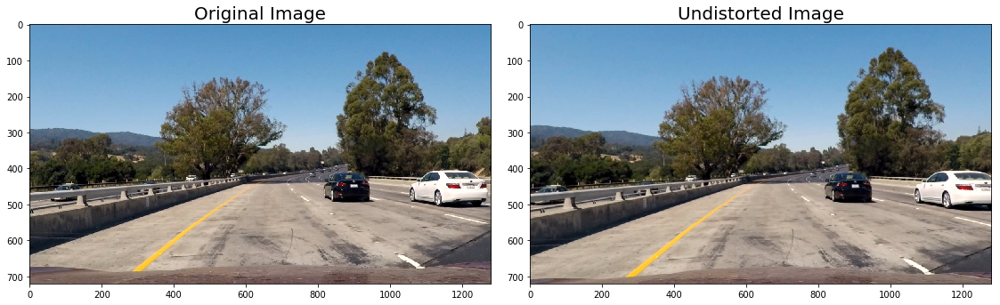

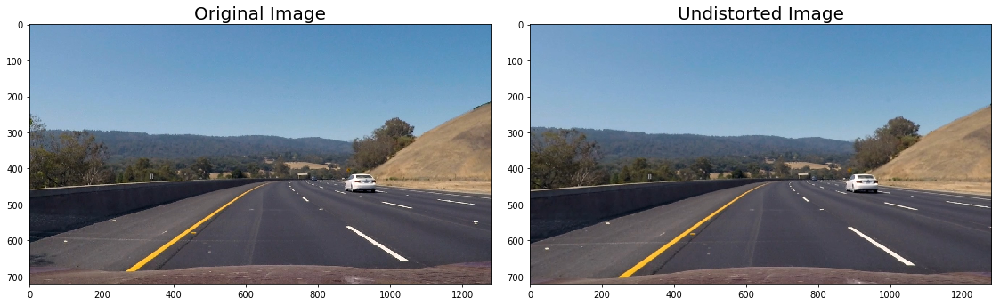

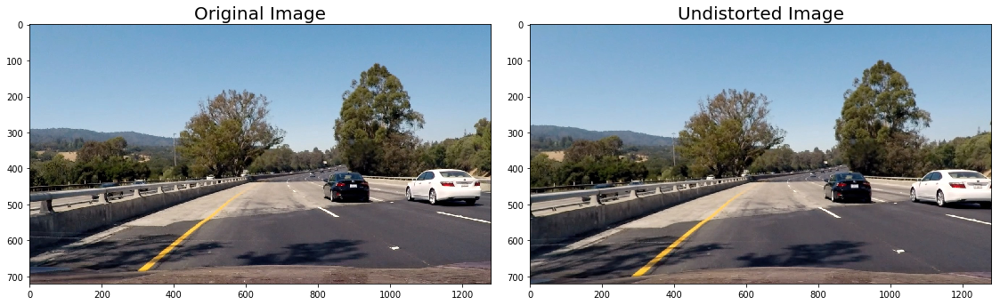

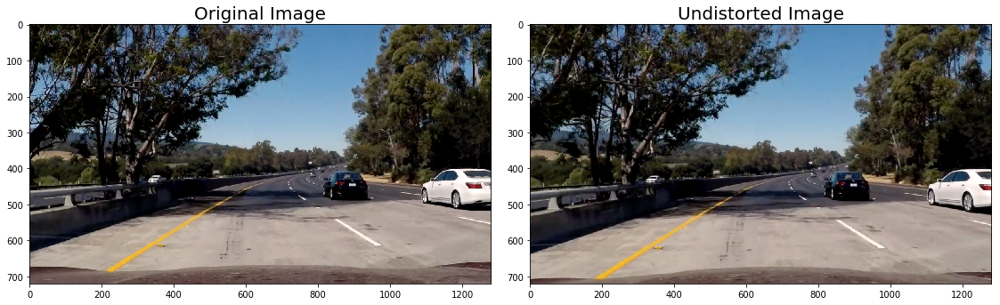

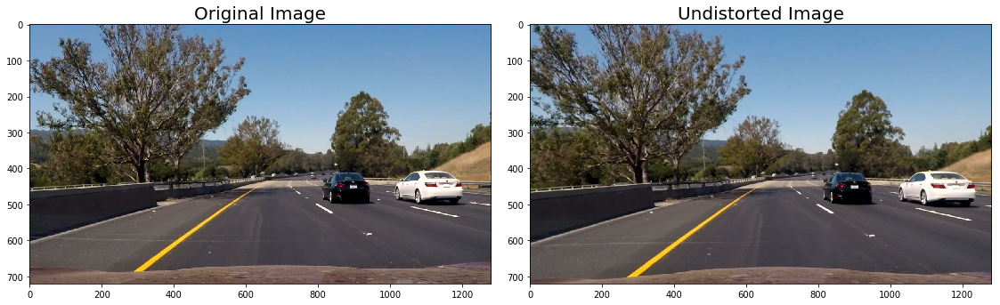

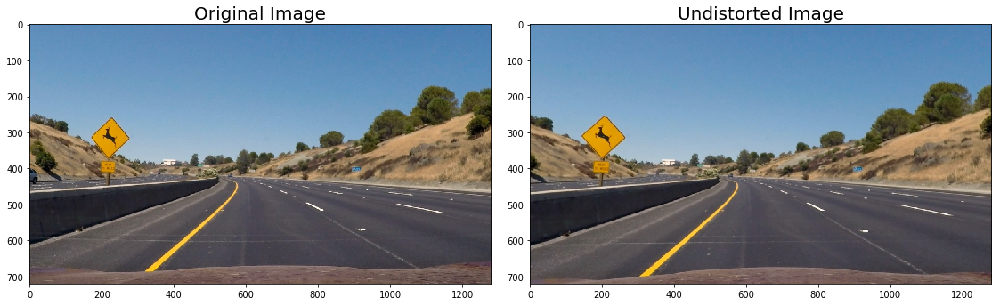

In [5]:
for fname in load_test_images():
    img = cv2.imread(fname)
    img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    height, width = img.shape[:2]
       
    undistorted = cal_undistort(img,objpoints,imgpoints)
    
    prefix = 'undistorted_'
    save_image(fname,prefix,undistorted)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 3. Use color transforms, gradients, etc., to create a thresholded binary image.

In [6]:
def combined_binary_img(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    return combined_binary    

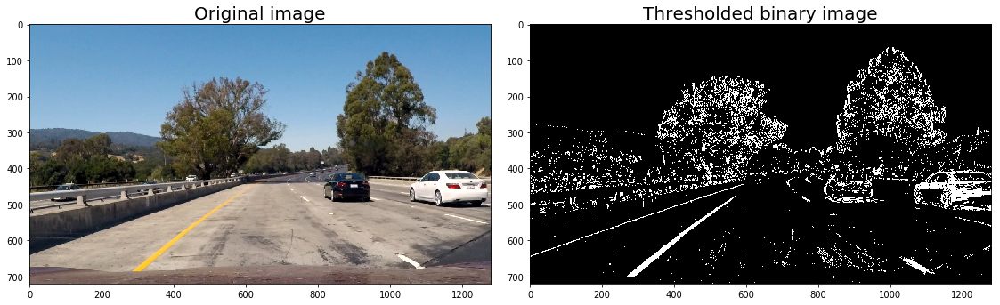

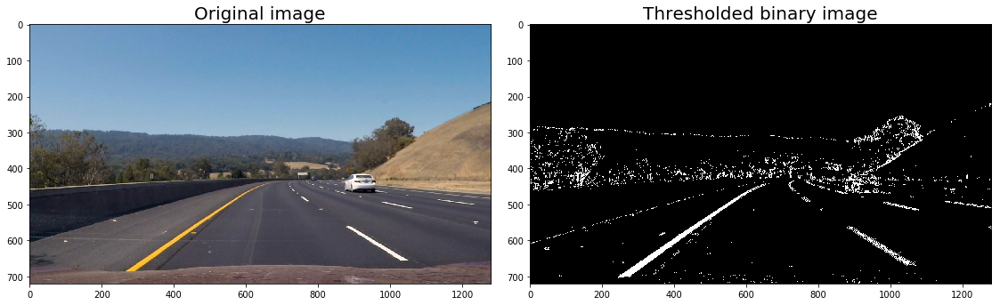

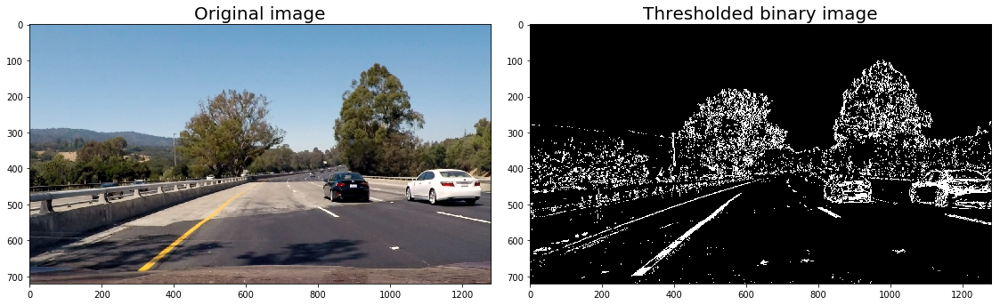

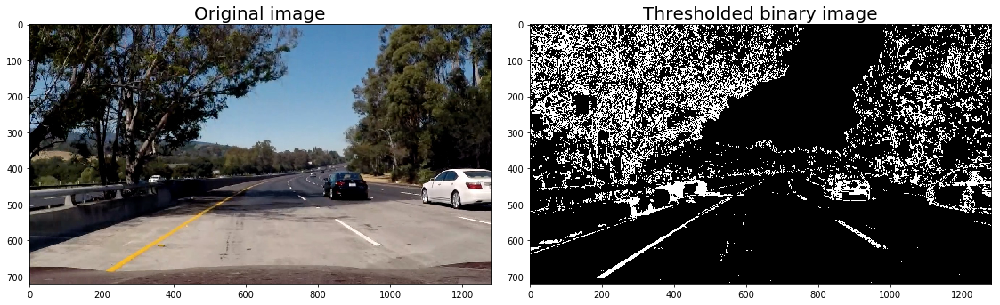

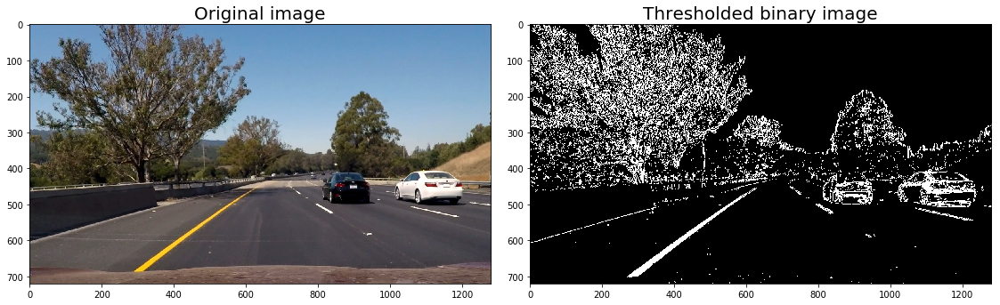

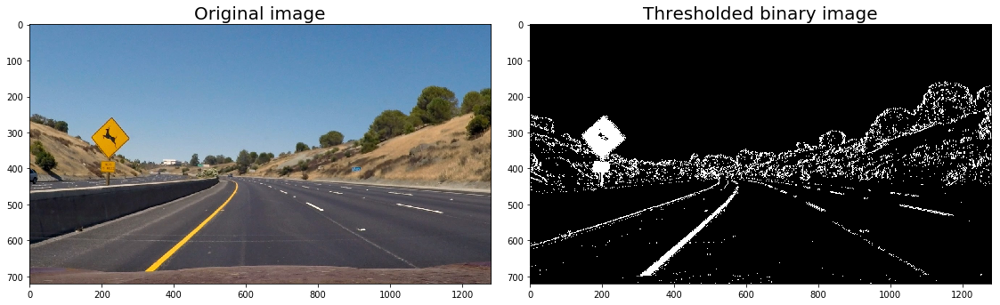

In [7]:
for fname in load_test_images():
    img = cv2.imread(fname)
    img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    undistorted = cal_undistort(img,objpoints,imgpoints)
    result = combined_binary_img(undistorted)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original image', fontsize=20)

    ax2.imshow(result,cmap='gray')
    ax2.set_title('Thresholded binary image', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)   
    
    prefix = 'thresholed_binary_'
    save_image(fname,prefix,result)

## 4. Apply a perspective transform to rectify binary image ("birds-eye view").

In [8]:
# Apply perspective transform to image and wrap it to get birds-eye view
def warp(undist_img,src,dst):   
    img_size = (undist_img.shape[1], undist_img.shape[0])   
    
    M = cv2.getPerspectiveTransform(src, dst) 
    Minv = cv2.getPerspectiveTransform(dst, src)
    warp = cv2.warpPerspective(undist_img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warp,Minv

In [9]:
def get_points():
    src_pts = np.float32([
                        [180, 700], # bottom-left 
                        [590, 460],  # top-left
                        [750, 460],  # top-right
                        [1170,700]  # bottom-right                        
                        ])
    
    dst_pts = np.float32([
                        [210, 720], # bottom-left 
                        [210, 0],    # top-left
                        [1100, 0],   # top-right
                        [1100, 720]  # bottom-right                        
                        ])
    
    return src_pts,dst_pts

In [10]:
# return thresholded warped image
def binary_and_warped_image(fname):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    
    copy_undistorted = np.copy(undistorted) 
 
    binary_img = combined_binary_img(copy_undistorted) 
    
    src_pts,dst_pts = get_points()
    
    wrap_img,_ = warp(undistorted,src_pts,dst_pts)
    birds_eye_img = combined_binary_img(wrap_img)   
    
    return undistorted,binary_img,birds_eye_img

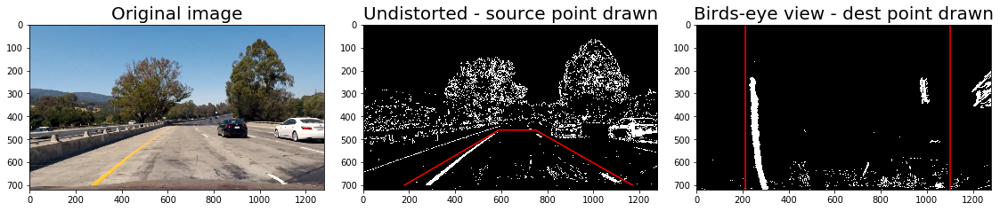

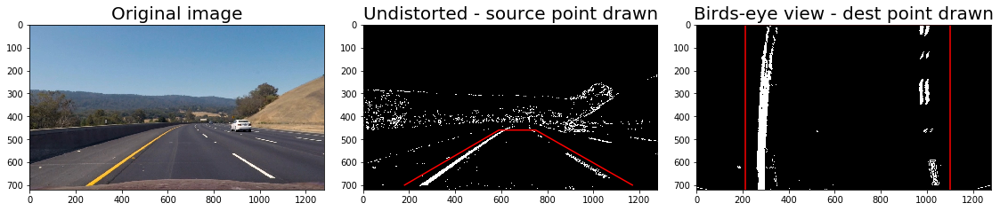

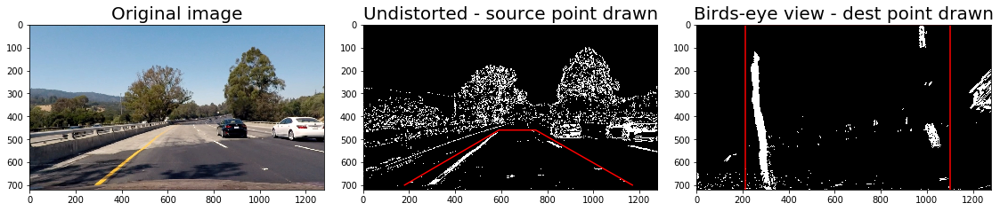

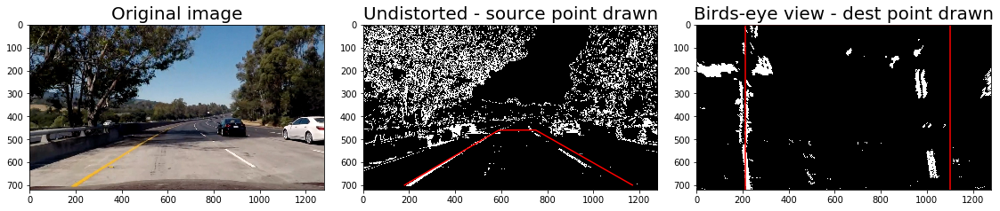

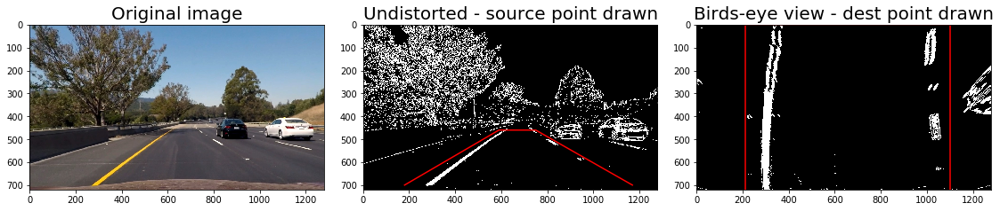

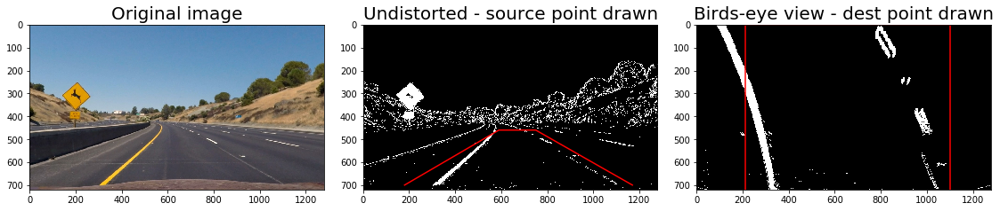

In [11]:
# Draw a trapezoidal line on the lane and draw a bird's eye view using the wrap method. 
for fname in load_test_images():
    undistorted,binary_img,birds_eye_img = binary_and_warped_image(fname)
    
    prefix = 'birdseye_'
    save_image(fname,prefix,birds_eye_img)
    
    # Draw rect line
    src_pts,dst_pts = get_points()
    dst = dst_pts.astype(np.int32)
    
    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 10))
    f.tight_layout()

    ax1.imshow(undistorted)
    ax1.set_title('Original image', fontsize=20)
    
    ax2.plot(src_pts[:,0],src_pts[:,1], color='red')
    ax2.imshow(binary_img,cmap='gray')    
    ax2.set_title('Undistorted - source point drawn', fontsize=20)
    
    ax3.plot(dst[:,0],dst[:,1], color='red')
    ax3.imshow(birds_eye_img,cmap='gray')
    ax3.set_title('Birds-eye view - dest point drawn', fontsize=20)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    

## 5. Detect lane pixels and fit to find the lane boundary.

In [12]:
# Get lane histogram 
def histgram(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half,axis=0)
    
    return histogram

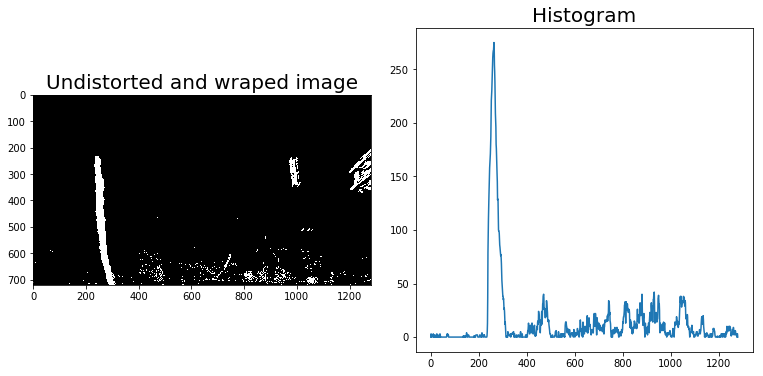

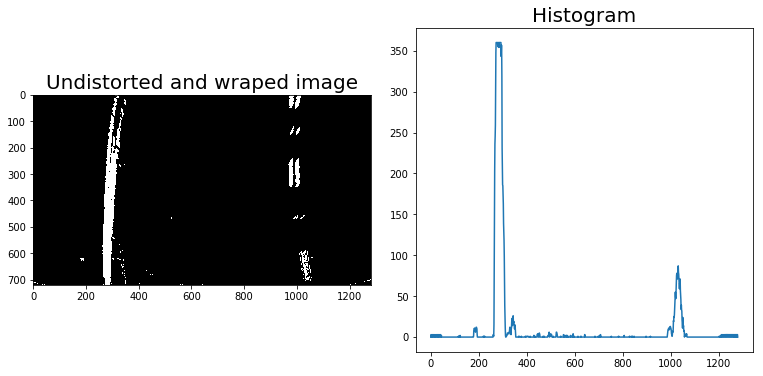

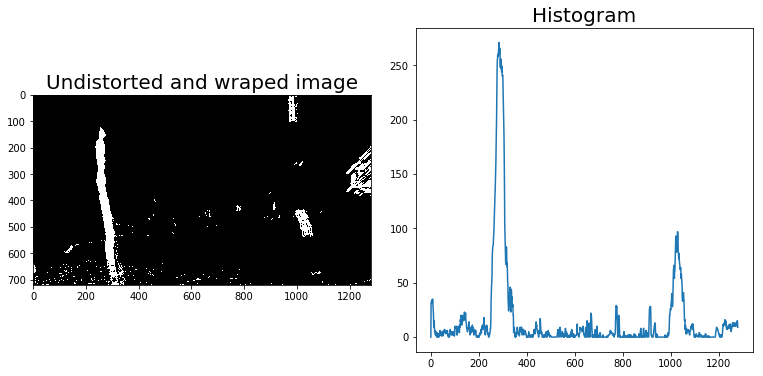

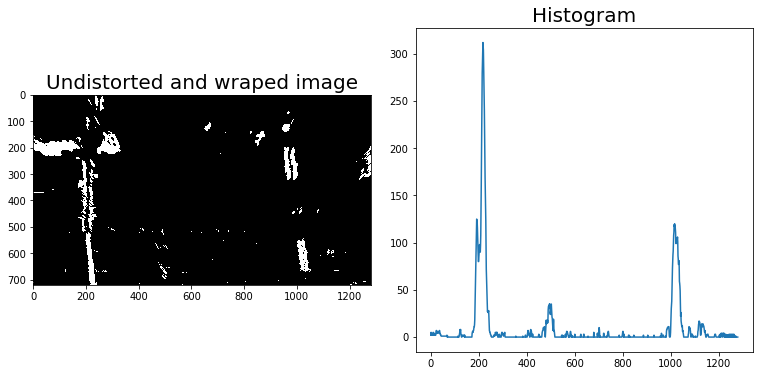

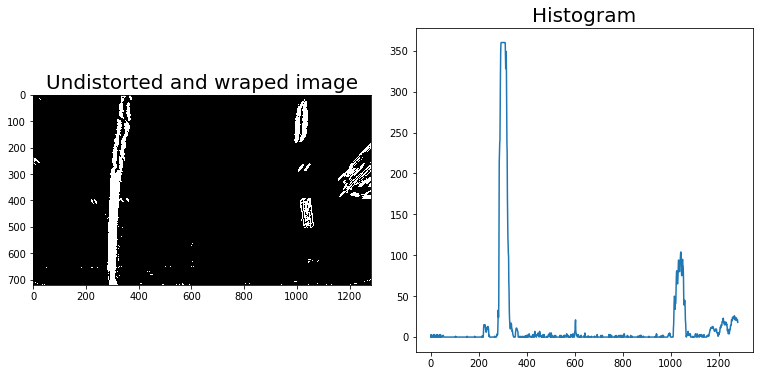

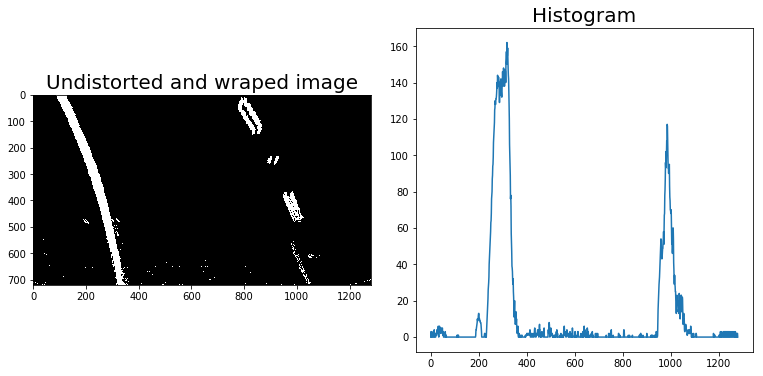

In [13]:
# Create histogram of image binary activations
for fname in load_test_images():
    img = cv2.imread(fname)
    img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    
    copy_undistorted = np.copy(undistorted)

    src_pts,dst_pts = get_points()
    birds_eye_img,_ = warp(undistorted,src_pts,dst_pts)
    
    thresholded_warped_image = combined_binary_img(birds_eye_img)    

    histogram = histgram(thresholded_warped_image)   
        
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    f.tight_layout()
    
    ax1.imshow(thresholded_warped_image,cmap='gray')
    ax1.set_title('Undistorted and wraped image', fontsize=20)
    
    ax2.plot(histogram)
    ax2.set_title('Histogram', fontsize=20)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

In [14]:
# Find lane pixels method
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError as e:
        # Avoids an error if the above is not implemented fully
        print('lane_inds error:',e)
        

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

In [15]:
# fit a polynomial to binary wraped image method
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        # print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img,left_fit,right_fit

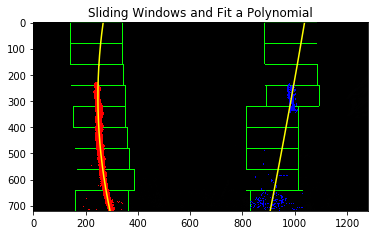

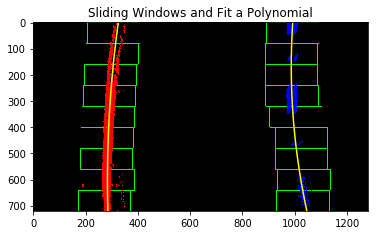

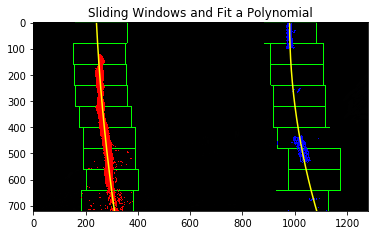

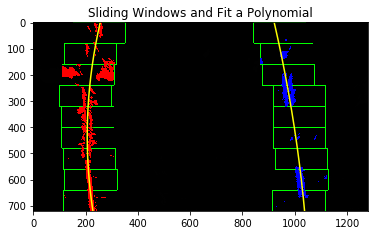

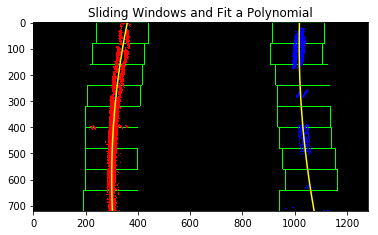

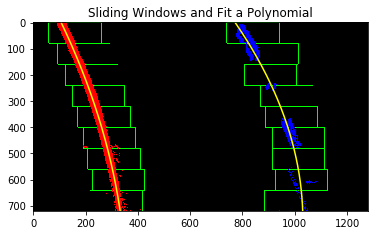

In [16]:
# Identify lane line pixels in the rectified binary image and draw sliding window and fit a polynomial

# Polynomial fit values
left_fit = []
right_fit = []

for fname in load_test_images():
    img = cv2.imread(fname)
    img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    
    copy_undistorted = np.copy(undistorted)
    (bottom_py, right_px) = (copy_undistorted.shape[0] - 1, copy_undistorted.shape[1] - 1)    
 
    src_pts,dst_pts = get_points()
    birds_eye_img,_ = warp(copy_undistorted,src_pts,dst_pts)
    
    thresholded_warped_image = combined_binary_img(birds_eye_img)
    
    plt.figure()
    
    out_img,left_fit,right_fit = fit_polynomial(thresholded_warped_image)
#     print('left_fit:',left_fit)
#     print('right_fit:',right_fit)

    # Plot the result
    plt.title("Sliding Windows and Fit a Polynomial")
    plt.imshow(out_img) 
      
    prefix = 'sliding_window_'
    save_image(fname,prefix,out_img)
    

In [17]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

In [18]:
# Search left & right lane area, get polynomial by fit_poly()
# Draw the lane onto the wraped blank image and plot the polynomial line
def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search   
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy
    + left_fit[2]-margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2)+
    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy+
    right_fit[2]-margin)) & (nonzerox<(right_fit[0]*(nonzeroy**2)+
    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin,ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin,ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result

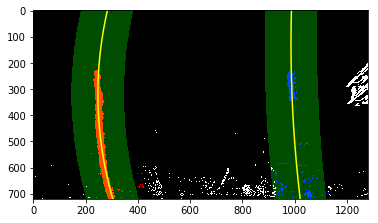

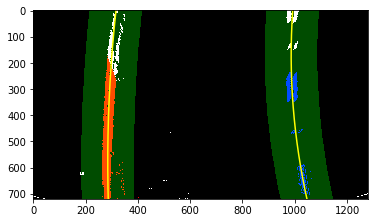

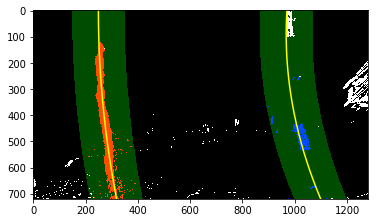

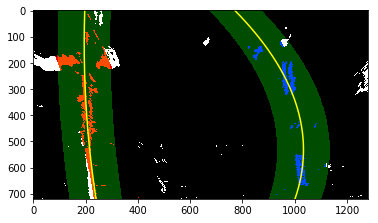

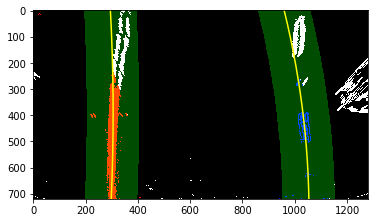

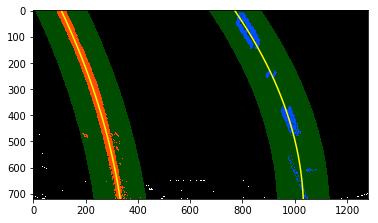

In [19]:
# Fit a polynomial to all the relevant pixels from sliding windows

# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits
for fname in load_test_images():
    img = cv2.imread(fname)
    img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    
    src_pts,dst_pts = get_points()
    birds_eye_img,_ = warp(undistorted,src_pts,dst_pts)
    
    thresholded_warped_image = combined_binary_img(birds_eye_img)
    
    plt.figure()
    
    try:
        result = search_around_poly(thresholded_warped_image)

        # View your output
        plt.imshow(result)
       
        prefix = 'fit_polynomial_sliding_window_'
        save_image(fname,prefix,result)
    except Exception as e:
        print('error:',e)

In [20]:
def search_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search    
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy
    + left_fit[2]-margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2)+
    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy+
    right_fit[2]-margin)) & (nonzerox<(right_fit[0]*(nonzeroy**2)+
    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    return left_fitx, right_fitx, ploty

In [21]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
def measure_curvature_real(binary_warped_image,left_fitx, right_fitx,ploty):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Implement the calculation of R_curve (radius of curvature) 
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
   
    # Distance from center real
    image = binary_warped_image    
    image_center = image.shape[1] // 2
    lane_center = (left_fitx[-1] + right_fitx[-1])/2.0
    center_offset = (image_center - lane_center) * xm_per_pix
    
    return left_curverad, right_curverad, center_offset

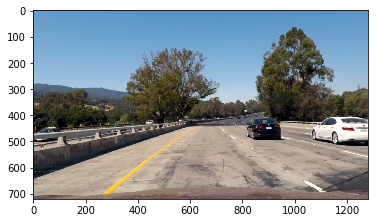

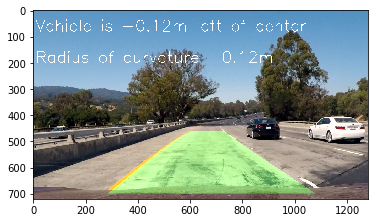

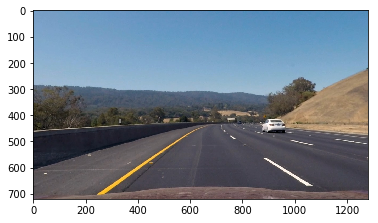

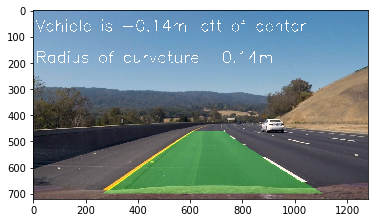

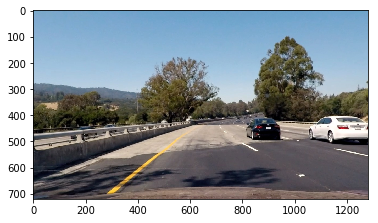

...

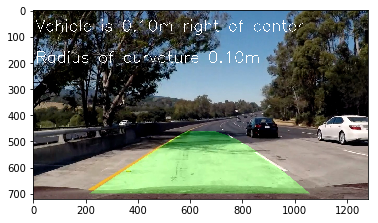

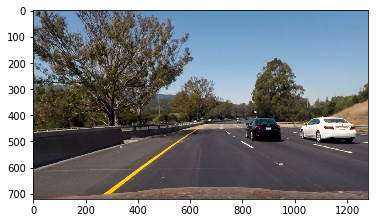

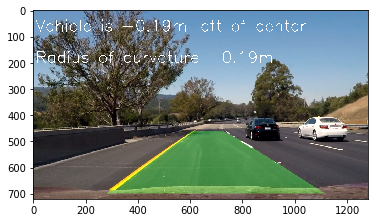

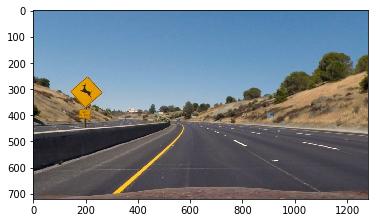

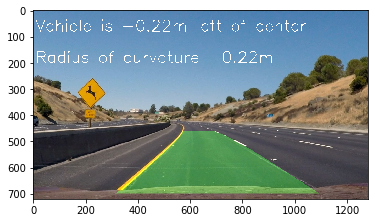

In [22]:
# Get left,right lane line and add weight to orignal image
for fname in load_test_images():
    img = cv2.imread(fname)
    img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    
    src_pts,dst_pts = get_points()
    birds_eye_img,Minv = warp(undistorted,src_pts,dst_pts)
    
    plt.figure()  
    plt.imshow(undistorted)   
    
    thresholded_warped_image = combined_binary_img(birds_eye_img)  

    left_fitx, right_fitx, ploty = search_poly(thresholded_warped_image)
    left_curverad, right_curverad, center_offset = measure_curvature_real(thresholded_warped_image, left_fitx, right_fitx, ploty)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(thresholded_warped_image).astype(np.uint8)        
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))       

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    # show distance and curvature
    if center_offset < 0:
        cv2.putText(result, "Vehicle is {:.2f}m left of center".format(center_offset),(10,80),fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, "Vehicle is {:.2f}m right of center".format(center_offset),(10,80),fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    
    curvature = (left_curverad + right_curverad) / 2
    cv2.putText(result, "Radius of curvature {:.2f}m".format(center_offset),(10,200),fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2) 
    
    plt.figure()  
    plt.imshow(result)  
       
    prefix = 'laneline_weighted_'
    save_image(fname,prefix,result)
    

In [36]:
# Define a class to receive the characteristics of each line detection
from collections import deque

class LaneLine():
    def __init__(self):
        max_que = 5 # max queue value
        self.margin = 100 # margin value
        
        # was the line detected in the last iteration?
        self.detected = False       
        
        # x values of the last n fits of the line
        self.recent_xfitted = deque(maxlen=max_que)           
        #polynomial coefficients averaged over the last n iterations
        self.best_fit0 = deque(maxlen=max_que)
        self.best_fit1 = deque(maxlen=max_que)
        self.best_fit2 = deque(maxlen=max_que)
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
        self.ym_per_pix = 30/720 # meters per pixel in y dimension
        self.xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # best x values of the fitted line over the last n iterations
    def bestx(self):
        bestx = np.mean(self.recent_xfitted)
        
        return bestx  
    
    # get best fit with polynomial coefficients averaged over the last n iterations
    def best_fit(self):   
        best_fit = [np.mean(self.best_fit0), np.mean(self.best_fit1), np.mean(self.best_fit2)]
        
        return best_fit  
    
    def fit_difference(fit):
        pass    
    
    # get lane line fit polynomial
    def fit_polynomial(self,x,y):
        # Fit a second order polynomial to each using `np.polyfit` ###
        fit = np.polyfit(y, x, 2)        

        return fit
    
    # get lane line fit x,y values
    def fit_poly(self,img_shape, x, y):
        ### Fit a second order polynomial to each with np.polyfit() ###
        fit = np.polyfit(y,x,2)
        
        # Generate x and y values for plotting
        ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
        
        fitx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]   
        
        return fitx, ploty

    # Skip the sliding windows step once you've found the lines
    def fit_poly_found(self,img_shape, fit):
        
        # Generate x and y values for plotting
        ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
        
        ### Calc both polynomials using ploty, fit
        fitx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]       

        return fitx, ploty
    
    # search line from first some frame and save the variable to use later
    def blind_search_line(self,binary_warped,x,y):       
        margin = self.margin
        
        if self.detected == False:
            # Grab activated pixels
            nonzero = binary_warped.nonzero()
            nonzeroy = np.array(nonzero[0])
            nonzerox = np.array(nonzero[1])

            ### Set the area of search based on activated x-values ###
            ### within the +/- margin of our polynomial function ###
            ### Hint: consider the window areas for the similarly named variables ###
            ### in the previous quiz, but change the windows to our new search area ###
            line_fit = self.fit_polynomial(x,y)
                                        
            lane_inds = ((nonzerox > (line_fit[0]*(nonzeroy**2) + line_fit[1]*nonzeroy
            + line_fit[2]-margin)) & (nonzerox < (line_fit[0]*(nonzeroy**2)+
            line_fit[1]*nonzeroy + line_fit[2] + margin)))
            
            # Again, extract line pixel positions
            x = nonzerox[lane_inds]
            y = nonzeroy[lane_inds]         

            try:
                # Fit new polynomials
                fitx, ploty = self.fit_poly(binary_warped.shape, x, y)            

                if np.sum(fitx) > 0:
                    self.detected = True            
                    self.recent_xfitted.append(fitx)
                    self.current_fit = line_fit

                    self.allx = fitx
                    self.ally = ploty

                    self.best_fit0.append(line_fit[0]) 
                    self.best_fit1.append(line_fit[1])
                    self.best_fit2.append(line_fit[2])            

                else:
                    self.detected = False    
            except:
                self.detected = False
        
    # search from previous found best fit
    def found_search_line(self,binary_warped):            
        margin = self.margin
        
        if self.detected == True:
            # Grab activated pixels
            nonzero = binary_warped.nonzero()
            nonzeroy = np.array(nonzero[0])
            nonzerox = np.array(nonzero[1])

            # best fit polynomials             
            best_fit = self.best_fit() 
                                        
            lane_inds = ((nonzerox > (best_fit[0]*(nonzeroy**2) + best_fit[1]*nonzeroy
            + best_fit[2]-margin)) & (nonzerox < (best_fit[0]*(nonzeroy**2)+
            best_fit[1]*nonzeroy + best_fit[2] + margin)))
            
            # Again, extract line pixel positions
            x = nonzerox[lane_inds]
            y = nonzeroy[lane_inds]         

            # Fit new polynomials
            try:
                fitx, ploty = self.fit_poly(binary_warped.shape, x, y)            

                if np.sum(fitx) > 0:
                    self.detected = True            
                    self.recent_xfitted.append(fitx)
                    self.current_fit = best_fit

                    self.allx = fitx
                    self.ally = ploty
                else:
                    self.detected = False 
            except:
                self.detected = False
    
    # Calculates the curvature of polynomial functions in meters.
    def measure_curvature_real(self):   
        
        fit_cr = np.polyfit(self.ally*self.ym_per_pix, self.allx*self.xm_per_pix, 2)
        
        # Define y-value where we want radius of curvature
        # We'll choose the maximum y-value, corresponding to the bottom of the image
        y_eval = np.max(self.ally)

        # Implement the calculation of R_curve (radius of curvature) 
        curvrad = ((1 + (2*fit_cr[0]*y_eval*self.ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
        
        return curvrad
    
    # Calculates the distance from center real
    def measure_distance_of_center_real(self,binary_warped_image):        
        image = binary_warped_image    
        image_center = image.shape[1] // 2
        lane_center = self.allx[-1]
        center_offset = (image_center - lane_center) * self.xm_per_pix

        return center_offset  
        

In [24]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [25]:
# Instance left,right lane line
left_line = LaneLine()
right_line = LaneLine()

#### pipeline method process ###
# 1.calibrate camera
# 2.undistorted image
# 3.wraped image
# 4.threshold wraped image
# 5.search each left,right line by blind and found method
# 6.calcurate left,right radius of curvature
# 7.calcurate distance from center
# 8.draw the lane and put text

def pipeline(image):   
    image = cv2.cvtColor(image,cv2.COLOR_RGB2BGR)
    undistorted = cal_undistort(image, objpoints, imgpoints)
    
    src_pts,dst_pts = get_points()
    birds_eye_img,Minv = warp(undistorted,src_pts,dst_pts)
    
    thresholded_warped_image = combined_binary_img(birds_eye_img)   
    
    # Find our lane pixels first
    lx, ly, rx, ry, _ = find_lane_pixels(thresholded_warped_image)
    
    # Search lane line
    if left_line.detected == True:
        left_line.found_search_line(thresholded_warped_image)
    elif left_line.detected == False:
        left_line.blind_search_line(thresholded_warped_image,lx,ly)
        
    if right_line.detected == True:
        right_line.found_search_line(thresholded_warped_image)
    elif right_line.detected == False:
        right_line.blind_search_line(thresholded_warped_image,rx,ry)    

    left_curverad = left_line.measure_curvature_real()
    right_curverad = right_line.measure_curvature_real() 
    
    # check sanity    
    '''
    Checking that they have similar curvature
    Checking that they are separated by approximately the right distance horizontally
    Checking that they are roughly parallel
    '''
    curvature_similar = np.abs(left_curverad - right_curverad)
#     print('curvature_similar:',curvature_similar)
#     if  curvature_similar > 50:
#         print('curvature_similar false')
    
    left_fit0 = left_line.current_fit[0]
    right_fit0 = right_line.current_fit[0]
    parallel = left_fit0 * right_fit0
#     print('parallel:',parallel)
#     if  parallel < 0:
#         print('parallel false')    
    
    left_center_offset = left_line.measure_distance_of_center_real(thresholded_warped_image)
    right_center_offset = right_line.measure_distance_of_center_real(thresholded_warped_image)
    center_offset = (left_center_offset + right_center_offset) / 2
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(thresholded_warped_image).astype(np.uint8)        
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))       

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_line.allx, left_line.ally]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.allx, right_line.ally])))])
    pts = np.hstack((pts_left, pts_right))   

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    
    image = cv2.cvtColor(image,cv2.COLOR_RGB2BGR)
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    # show distance and curvature
    if center_offset < 0:
        center_offset = np.abs(center_offset)
        cv2.putText(result, "Vehicle is {:.2f}m left of center".format(center_offset),(10,80),fontFace = 16, fontScale = 1, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, "Vehicle is {:.2f}m right of center".format(center_offset),(10,80),fontFace = 16, fontScale = 1, color=(255,255,255), thickness = 2)
    
    curvature = (left_curverad + right_curverad) / 2
    cv2.putText(result, "Radius of curvature {:.2f}m".format(curvature),(10,150),fontFace = 16, fontScale = 1, color=(255,255,255), thickness = 2) 
    
    
    return result

In [26]:
white_output = 'project_video_output.mp4'
# clip1 = VideoFileClip("project_video.mp4").subclip(0,10)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
get_ipython().run_line_magic('time', 'white_clip.write_videofile(white_output, audio=False)')

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [24:04<00:01,  1.14s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 21min 46s, sys: 3.46 s, total: 21min 50s
Wall time: 24min 7s


In [27]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

In [28]:
white_output2 = 'challenge_video_output.mp4'
# clip1 = VideoFileClip("challenge_video.mp4").subclip(0,10)
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
get_ipython().run_line_magic('time', 'white_clip.write_videofile(white_output2, audio=False)')


[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [09:10<00:00,  1.13s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 8min 21s, sys: 1.27 s, total: 8min 22s
Wall time: 9min 13s


In [29]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output2))

In [35]:
white_output3 = 'harder_challenge_video_output.mp4'
# clip1 = VideoFileClip("challenge_video.mp4").subclip(0,10)
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
get_ipython().run_line_magic('time', 'white_clip.write_videofile(white_output3, audio=False)')

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4



 13%|█▎        | 152/1200 [02:55<20:28,  1.17s/it]


 25%|██▌       | 303/1200 [05:55<17:37,  1.18s/it]


 38%|███▊      | 454/1200 [08:58<14:31,  1.17s/it]


 50%|█████     | 605/1200 [11:54<11:31,  1.16s/it]


 63%|██████▎   | 756/1200 [14:59<08:54,  1.20s/it]


 76%|███████▌  | 907/1200 [18:03<05:42,  1.17s/it]


 88%|████████▊ | 1057/1200 [21:01<02:50,  1.19s/it]


100%|█████████▉| 1199/1200 [23:50<00:01,  1.18s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 21min, sys: 10.1 s, total: 21min 10s
Wall time: 23min 54s


In [37]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output3))